In [1]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os

import plotly
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
from collections import Counter


## Splitting data into Train and Test

In [2]:
X_train = pd.read_csv('preprocessed_data.csv', nrows=50000)
X_train.head(2)

,Unnamed: 0,Unnamed: 0.1,id,teacher_id,teacher_prefix,school_state,Date,project_grade_category,project_title,project_essay_1,...,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,price,quantity
0,0,8393,p205479,2bf07ba08945e5d8b2a3f269b2b3cfe5,MRS,CA,2016-04-27 00:27:36,Grades_PreK_2,Engineering STEAM into the Primary Classroom,I have been fortunate enough to use the Fairy ...,...,Each month I try to do several science or STEM...,It is challenging to develop high quality scie...,My students need STEM kits to learn critical s...,53,1,Math_Science,AppliedSciences Health_LifeScience,I have been fortunate enough to use the Fairy ...,725.05,4
1,1,37728,p043609,3f60494c61921b3b43ab61bdde2904df,MS,UT,2016-04-27 00:31:25,Grades_3_5,Sensory Tools for Focus,Imagine being 8-9 years old. You're in your th...,...,It is tough to do more than one thing at a tim...,When my students are able to calm themselves d...,My students need Boogie Boards for quiet senso...,4,1,SpecialNeeds,SpecialNeeds,Imagine being 8-9 years old. You're in your th...,213.03,8


In [3]:
X_train.head(2)

,Unnamed: 0,Unnamed: 0.1,id,teacher_id,teacher_prefix,school_state,Date,project_grade_category,project_title,project_essay_1,...,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,price,quantity
0,0,8393,p205479,2bf07ba08945e5d8b2a3f269b2b3cfe5,MRS,CA,2016-04-27 00:27:36,Grades_PreK_2,Engineering STEAM into the Primary Classroom,I have been fortunate enough to use the Fairy ...,...,Each month I try to do several science or STEM...,It is challenging to develop high quality scie...,My students need STEM kits to learn critical s...,53,1,Math_Science,AppliedSciences Health_LifeScience,I have been fortunate enough to use the Fairy ...,725.05,4
1,1,37728,p043609,3f60494c61921b3b43ab61bdde2904df,MS,UT,2016-04-27 00:31:25,Grades_3_5,Sensory Tools for Focus,Imagine being 8-9 years old. You're in your th...,...,It is tough to do more than one thing at a tim...,When my students are able to calm themselves d...,My students need Boogie Boards for quiet senso...,4,1,SpecialNeeds,SpecialNeeds,Imagine being 8-9 years old. You're in your th...,213.03,8


## 1.4 Encoding Categorical and Numerical features

### 1.4.1 encoding categorical features: clean_categories

In [4]:
vectorizer_cat = CountVectorizer()
vectorizer_cat.fit(X_train['clean_categories'].values) # fit has to happen only on train data

X_train_cc_ohe = vectorizer_cat.transform(X_train['clean_categories'].values)

print("After vectorizations")
print(X_train_cc_ohe.shape)
print(vectorizer_cat.get_feature_names())

After vectorizations
(50000, 9)
['appliedlearning', 'care_hunger', 'health_sports', 'history_civics', 'literacy_language', 'math_science', 'music_arts', 'specialneeds', 'warmth']


### 1.4.2 encoding categorical features: clean_subcategories

In [5]:
vectorizer_subcat = CountVectorizer()
vectorizer_subcat.fit(X_train['clean_subcategories'].values) # fit has to happen only on train data

X_train_csc_ohe = vectorizer_subcat.transform(X_train['clean_subcategories'].values)

print("After vectorizations")
print(X_train_csc_ohe.shape)
print(vectorizer_subcat.get_feature_names())

After vectorizations
(50000, 30)
['appliedsciences', 'care_hunger', 'charactereducation', 'civics_government', 'college_careerprep', 'communityservice', 'earlydevelopment', 'economics', 'environmentalscience', 'esl', 'extracurricular', 'financialliteracy', 'foreignlanguages', 'gym_fitness', 'health_lifescience', 'health_wellness', 'history_geography', 'literacy', 'literature_writing', 'mathematics', 'music', 'nutritioneducation', 'other', 'parentinvolvement', 'performingarts', 'socialsciences', 'specialneeds', 'teamsports', 'visualarts', 'warmth']


### 1.4.3 encoding categorical features: school_state

In [6]:
vectorizer_school_state = CountVectorizer()
vectorizer_school_state.fit(X_train['school_state'].values) 

X_train_state_ohe = vectorizer_school_state.transform(X_train['school_state'].values)

print("After vectorizations")
print(X_train_state_ohe.shape)
print(vectorizer_school_state.get_feature_names())

After vectorizations
(50000, 51)
['ak', 'al', 'ar', 'az', 'ca', 'co', 'ct', 'dc', 'de', 'fl', 'ga', 'hi', 'ia', 'id', 'il', 'in', 'ks', 'ky', 'la', 'ma', 'md', 'me', 'mi', 'mn', 'mo', 'ms', 'mt', 'nc', 'nd', 'ne', 'nh', 'nj', 'nm', 'nv', 'ny', 'oh', 'ok', 'or', 'pa', 'ri', 'sc', 'sd', 'tn', 'tx', 'ut', 'va', 'vt', 'wa', 'wi', 'wv', 'wy']


### 1.4.4 encoding categorical features: teacher_prefix

In [7]:
vectorizer_prefix = CountVectorizer()
vectorizer_prefix.fit(X_train['teacher_prefix'].values)

X_train_teacher_ohe = vectorizer_prefix.transform(X_train['teacher_prefix'].values)

print("After vectorizations")
print(X_train_teacher_ohe.shape)
print(vectorizer_prefix.get_feature_names())

After vectorizations
(50000, 5)
['dr', 'mr', 'mrs', 'ms', 'teacher']


### 1.4.5 encoding categorical features: project_grade_category

In [8]:
vectorizer_grade = CountVectorizer()
vectorizer_grade.fit(X_train['project_grade_category'].values) 

X_train_grade_ohe = vectorizer_grade.transform(X_train['project_grade_category'].values)

print("After vectorizations")
print(X_train_grade_ohe.shape)
print(vectorizer_grade.get_feature_names())

After vectorizations
(50000, 4)
['grades_3_5', 'grades_6_8', 'grades_9_12', 'grades_prek_2']


### 1.4.6 encoding numerical features: price

In [9]:
from sklearn.preprocessing import Normalizer
normalizer = Normalizer()
normalizer.fit(X_train['price'].values.reshape(1,-1))

X_train_price_norm = normalizer.transform(X_train['price'].values.reshape(1,-1)).reshape(-1,1)

print("After vectorizations")
print(X_train_price_norm.shape)
print(X_train_price_norm)

After vectorizations
(50000, 1)
[[6.65668186e-03]
 [1.95582779e-03]
 [3.02054801e-03]
 ...
 [5.96581184e-04]
 [6.05945800e-05]
 [4.58958039e-04]]


### 1.4.7 encoding numerical features: teacher_number_of_previously_posted_projects

In [10]:

from sklearn.preprocessing import Normalizer
normalizer = Normalizer()
# normalizer.fit(X_train['price'].values)
# this will rise an error Expected 2D array, got 1D array instead: 
# array=[105.22 215.96  96.01 ... 368.98  80.53 709.67].
# Reshape your data either using 
# array.reshape(-1, 1) if your data has a single feature 
# array.reshape(1, -1)  if it contains a single sample.
normalizer.fit(X_train['teacher_number_of_previously_posted_projects'].values.reshape(1,-1))

X_train_ppp_norm = normalizer.transform(X_train['teacher_number_of_previously_posted_projects'].values.reshape(1,-1)).reshape(-1,1)

print("After vectorizations")
print(X_train_ppp_norm.shape)
print(X_train_ppp_norm)

After vectorizations
(50000, 1)
[[0.00922079]
 [0.00069591]
 [0.00173977]
 ...
 [0.00017398]
 [0.        ]
 [0.00017398]]


### 1.4.8 encoding numerical features: quantity

In [11]:
from sklearn.preprocessing import Normalizer
normalizer = Normalizer()
# normalizer.fit(X_train['price'].values)
# this will rise an error Expected 2D array, got 1D array instead: 
# array=[105.22 215.96  96.01 ... 368.98  80.53 709.67].
# Reshape your data either using 
# array.reshape(-1, 1) if your data has a single feature 
# array.reshape(1, -1)  if it contains a single sample.
normalizer.fit(X_train['quantity'].values.reshape(1,-1))

X_train_quantity_norm = normalizer.transform(X_train['quantity'].values.reshape(1,-1)).reshape(-1,1)

print("After vectorizations")
print(X_train_quantity_norm.shape)
print(X_train_quantity_norm)

After vectorizations
(50000, 1)
[[0.00053749]
 [0.00107498]
 [0.00013437]
 ...
 [0.00161247]
 [0.00591239]
 [0.00268745]]


### 1.4.9 encoding numerical features: sentiment score's of each of the essay

In [12]:
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer

# import nltk
# nltk.download('vader_lexicon')

sid = SentimentIntensityAnalyzer()
ss_train = []
ss_test = []
for essay in X_train['essay']:
    ss_train.append(sid.polarity_scores(essay)['pos'])


# we can use these 4 things as features/attributes (neg, neu, pos, compound)
# neg: 0.0, neu: 0.753, pos: 0.247, compound: 0.93

print(len(ss_train))
print(ss_train[7])

ss_train_array = np.array(ss_train)
print(ss_train_array.shape)

50000
0.236
(50000,)


In [13]:
from sklearn.preprocessing import Normalizer
normalizer = Normalizer()
normalizer.fit(ss_train_array.reshape(1,-1))

X_train_ss_norm = normalizer.transform(ss_train_array.reshape(1,-1)).reshape(-1,1)

print("After vectorizations")
print(X_train_ss_norm.shape)
print(X_train_ss_norm)

After vectorizations
(50000, 1)
[[0.0032371 ]
 [0.00414447]
 [0.00436518]
 ...
 [0.00252592]
 [0.00350686]
 [0.00279568]]


### 1.4.10 encoding numerical features: number of words in the title

In [14]:
title_word_count_train = []

for i in X_train['project_title']:
    title_word_count_train.append(len(i.split()))


print(len(title_word_count_train))
print(title_word_count_train[7])
print(title_word_count_train[7])

title_word_count_train_array = np.array(title_word_count_train)
print(title_word_count_train_array.shape)

50000
5
5
(50000,)


In [15]:
from sklearn.preprocessing import Normalizer
normalizer = Normalizer()
normalizer.fit(title_word_count_train_array.reshape(1,-1))

X_train_twc_norm = normalizer.transform(title_word_count_train_array.reshape(1,-1)).reshape(-1,1)

print("After vectorizations")
print(X_train_twc_norm.shape)
print(X_train_twc_norm)

After vectorizations
(50000, 1)
[[0.00477896]
 [0.00318598]
 [0.00557546]
 ...
 [0.00398247]
 [0.00637195]
 [0.00238948]]


### 1.4.11 encoding numerical features: number of words in the combine essays

In [16]:
essay_word_count_train = []
essay_word_count_test = []
for i in X_train['essay']:
    essay_word_count_train.append(len(i.split()))


print(len(essay_word_count_train))
print(essay_word_count_train[7])


essay_word_count_train_array = np.array(essay_word_count_train)
print(essay_word_count_train_array.shape)

50000
417
(50000,)


In [17]:
from sklearn.preprocessing import Normalizer
normalizer = Normalizer()
normalizer.fit(essay_word_count_train_array.reshape(1,-1))

X_train_ewc_norm = normalizer.transform(essay_word_count_train_array.reshape(1,-1)).reshape(-1,1)

print("After vectorizations")
print(X_train_ewc_norm.shape)
print(X_train_ewc_norm)

After vectorizations
(50000, 1)
[[0.00477403]
 [0.00577909]
 [0.00296493]
 ...
 [0.00348421]
 [0.00366847]
 [0.00557808]]


## 1.5 Vectorizing Text features

### 1.5.1 Vectorizing using BOW 

#### Essay

In [18]:

print(X_train.shape)

print("\n\n")


vectorizer_bow_essay = CountVectorizer(min_df=10,ngram_range=(1,4), max_features=5000)
vectorizer_bow_essay.fit(X_train['essay'].values) # fit has to happen only on train data

X_train_essay_bow = vectorizer_bow_essay.transform(X_train['essay'].values)

print("After vectorizations")
print(X_train_essay_bow.shape)


(50000, 21)



After vectorizations
(50000, 5000)


#### project_title

In [19]:
vectorizer_bow_title = CountVectorizer(min_df=10,ngram_range=(1,4), max_features=5000)
vectorizer_bow_title.fit(X_train['project_title'].values) # fit has to happen only on train data


X_train_titles_bow = vectorizer_bow_title.transform(X_train['project_title'].values)

print("After vectorizations")
print(X_train_titles_bow.shape)

After vectorizations
(50000, 5000)


#### project_resource_summary

In [20]:
vectorizer_bow_rs = CountVectorizer(min_df=10,ngram_range=(1,4), max_features=5000)
vectorizer_bow_rs.fit(X_train['project_resource_summary'].values) # fit has to happen only on train data


X_train_psr_bow = vectorizer_bow_rs.transform(X_train['project_resource_summary'].values)

print("After vectorizations")
print(X_train_psr_bow.shape)

After vectorizations
(50000, 5000)


### Merging all the categorical and numerical features with variations of text features

In [21]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack

X_train_bow_matrix = hstack((X_train_cc_ohe, X_train_csc_ohe, X_train_grade_ohe, X_train_state_ohe, 
                             X_train_teacher_ohe, X_train_price_norm, X_train_ppp_norm, 
                             X_train_ewc_norm, X_train_twc_norm, X_train_ss_norm, X_train_quantity_norm,
                             X_train_essay_bow, X_train_titles_bow, X_train_psr_bow)).tocsr()


print("Final Data matrix")
print(X_train_bow_matrix.shape)

Final Data matrix
(50000, 15105)


### Getting top 5000 features

In [22]:
from sklearn.feature_selection import SelectKBest, chi2
X_with_5k_features = SelectKBest(chi2,k=5000).fit(X_train_bow_matrix, X_train['project_is_approved']).transform(X_train_bow_matrix)

In [23]:
X_with_5k_features.shape

(50000, 5000)

### Finding the best K for K-Means clustering

In [24]:
from sklearn.cluster import KMeans

k = [2,3,4,5,10]
inertia = []
for i in tqdm(k):
    kmeans = KMeans(n_clusters=i, n_jobs=-1).fit(X_with_5k_features)
    inertia.append(kmeans.inertia_)

100%|████████████████████████████████████████████████████████████████████████████████| 5/5 [3:01:34<00:00, 2178.92s/it]


### Plotting K vs Inertia to get the best K

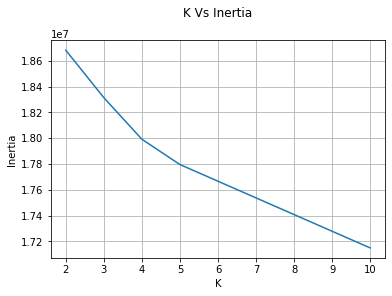

In [25]:
plt.plot(k, inertia)
plt.xlabel('K')
plt.ylabel('Inertia')
plt.title('K Vs Inertia', y =1.08)
plt.grid()
plt.show()

In [26]:
#From the above plot
best_K = 5

### Applying K-Means clustering with obtained best K

In [27]:
kmeans = KMeans(n_clusters=best_K, n_jobs=-1).fit(X_with_5k_features)

In [28]:
essays = X_train['essay'].values
results = X_train['project_is_approved'].values
res1 = []
res2 = []
res3 = []
res4 = []
res5 = []
cluster1 = []
cluster2 = []
cluster3 = []
cluster4 = []
cluster5 = []
for i in tqdm(range(kmeans.labels_.shape[0])):
    if kmeans.labels_[i] == 0:
        cluster1.append(essays[i])
        res1.append(results[i])
    elif kmeans.labels_[i] == 1:
        cluster2.append(essays[i])
        res2.append(results[i])
    elif kmeans.labels_[i] == 2:
        cluster3.append(essays[i])
        res3.append(results[i])
    elif  kmeans.labels_[i] == 3:
        cluster4.append(essays[i])
        res4.append(results[i])
    elif  kmeans.labels_[i] == 4:
        cluster5.append(essays[i])
        res5.append(results[i])

100%|████████████████████████████████████████████████████████████████████████| 50000/50000 [00:00<00:00, 611184.71it/s]


In [29]:
print('project approval status is {}\n'.format(res1[0]))
print('essay is\n',cluster1[0])

project approval status is 1

essay is
 I have been fortunate enough to use the Fairy Tale STEM kits in my classroom as well as the STEM journals, which my students really enjoyed.  I would love to implement more of the Lakeshore STEM kits in my classroom for the next school year as they provide excellent and engaging STEM lessons.My students come from a variety of backgrounds, including language and socioeconomic status.  Many of them don't have a lot of experience in science and engineering and these kits give me the materials to provide these exciting opportunities for my students.Each month I try to do several science or STEM/STEAM projects.  I would use the kits and robot to help guide my science instruction in engaging and meaningful ways.  I can adapt the kits to my current language arts pacing guide where we already teach some of the material in the kits like tall tales (Paul Bunyan) or Johnny Appleseed.  The following units will be taught in the next school year where I will i

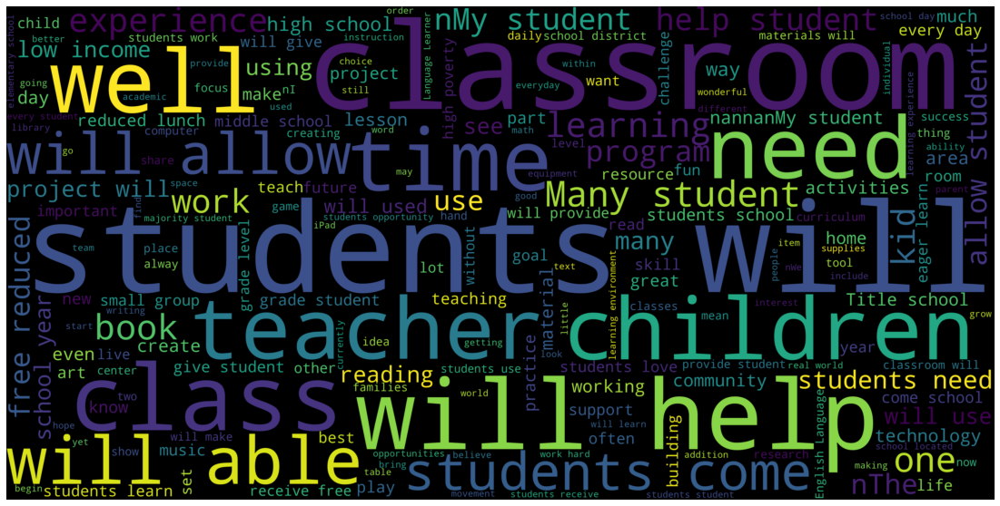

In [30]:
#cluster 1
words=''
for i in cluster1:
    words+=str(i)
from wordcloud import WordCloud
wordcloud = WordCloud(width=5000,height=2500,background_color="black").generate(words)

# Display the generated image:
plt.figure( figsize=(20,10)) 
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [31]:
print('project approval status is {}\n'.format(res2[0]))
print('essay is\n',cluster2[0])

project approval status is 1

essay is
 Having a class of 24 students comes with diverse learners.  Some students learn best through auditory means.I have a class of twenty-four kindergarten students.\r\nMy students attend a Title 1 school and a great majority are English language learners. Most of our students come from low-income homes, and all students receive free breakfast and lunch. My students are enthusiastic learners, but too often are faced with many types of hardships at home. School is often a safe haven for them.By having a mobile listening and storage center, my students will be able to reinforce and enhance what they are learning.  They will be able to listen to stories using the mobile listening center to help reinforce the high frequency words that have been introduced.  In addition, they will be able to listen to stories that reinforce reading comprehension skills and strategies amongst other auditory experiences.A mobile listening center will help keep equipment neat

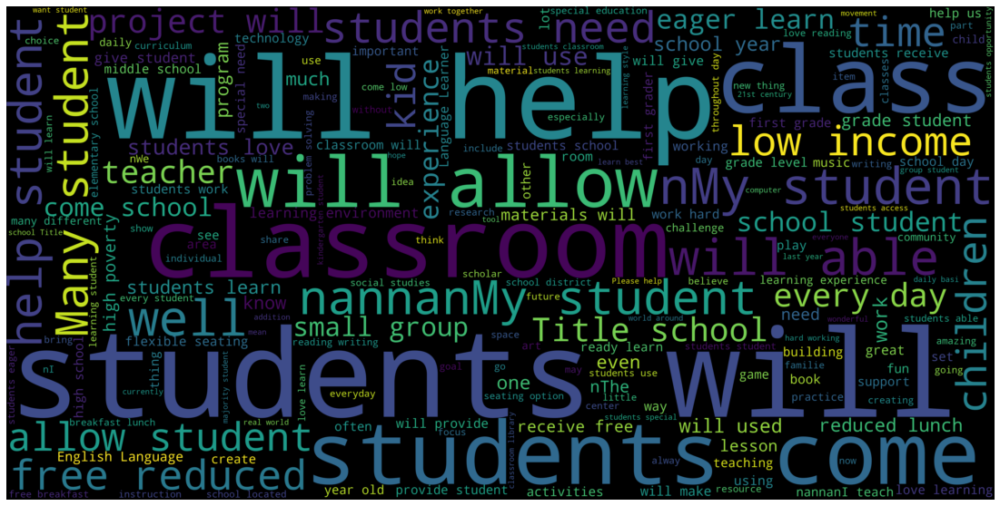

In [32]:
#cluster 2
words=''
for i in cluster2:
    words+=str(i)
from wordcloud import WordCloud
wordcloud = WordCloud(width=5000,height=2500,background_color="black").generate(words)

# Display the generated image:
plt.figure( figsize=(20,10)) 
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [33]:
print('project approval status is {}\n'.format(res3[0]))
print('essay is\n',cluster3[0])

project approval status is 1

essay is
 \"Sitting still is overrated. It makes sense for the opera or for meditating, but in most classrooms and child care centers, it's given far more honor than it deserves. Children need to move.\" Tom Hunter,National Association for the Education of Young Children. Our class is flexible and collaborativeWe are a room full of bright, curious, innovative, and wiggly third graders.  Our brains work best when we are comfortable and have space to move around and collaborate with our peers.  Our teacher provides us a child centered environment where we can use our critical thinking skills through research and inquiry.  While education is evolving with new, rigorous standards, and we are incorporating technology to experience the world, our teacher needs help to keep our brains moving...by keeping US MOVING!  Thank you for helping us grow and learn.We will use this new and modern furniture to help the kids to work ergonomically.   We all need to be able to

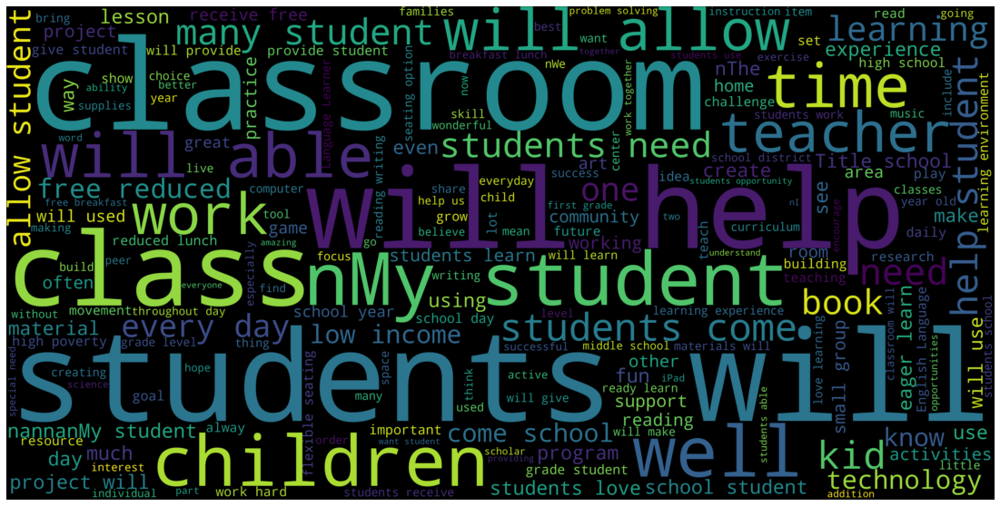

In [34]:
#cluster 3
words=''
for i in cluster3:
    words+=str(i)
from wordcloud import WordCloud
wordcloud = WordCloud(width=5000,height=2500,background_color="black").generate(words)

# Display the generated image:
plt.figure( figsize=(20,10)) 
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [35]:
print('project approval status is {}\n'.format(res4[0]))
print('essay is\n',cluster4[0])

project approval status is 1

essay is
 Imagine being 8-9 years old. You're in your third grade classroom. You see bright lights, the kid next to you is chewing gum, the birds are making noise, the street outside is buzzing with cars, it's hot, and your teacher is asking you to focus on learning. Ack! You need a break! So do my students.Most of my students have autism, anxiety, another disability, or all of the above. It is tough to focus in school due to sensory overload or emotions. My students have a lot to deal with in school, but I think that makes them the most incredible kids on the planet. They are kind, caring, and sympathetic. They know what it's like to be overwhelmed, so they understand when someone else is struggling. They are open-minded and compassionate. They are the kids who will someday change the world.It is tough to do more than one thing at a time. When sensory overload gets in the way, it is the hardest thing in the world to focus on learning. My students need man

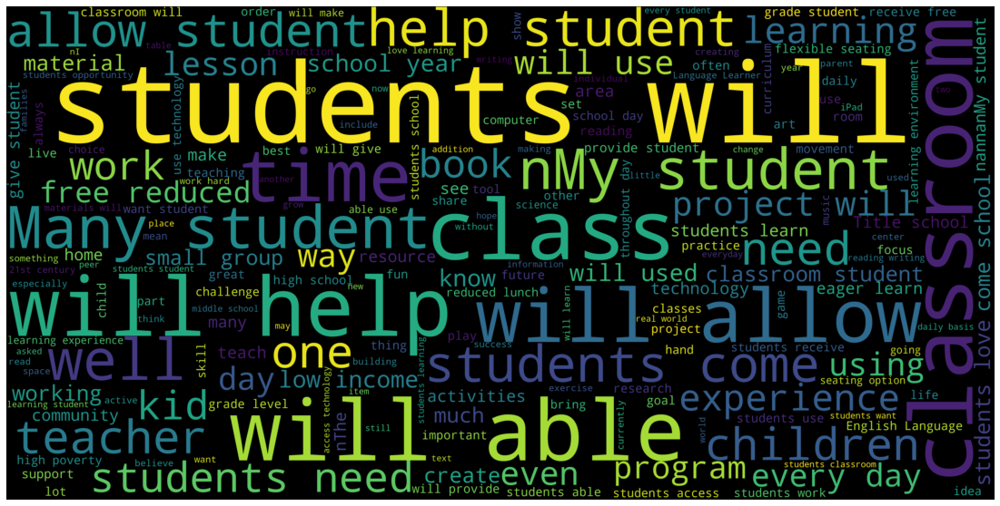

In [36]:
#cluster 4
words=''
for i in cluster4:
    words+=str(i)
from wordcloud import WordCloud
wordcloud = WordCloud(width=5000,height=2500,background_color="black").generate(words)

# Display the generated image:
plt.figure( figsize=(20,10)) 
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [37]:
print('project approval status is {}\n'.format(res5[0]))
print('essay is\n',cluster5[0])

project approval status is 1

essay is
 Do you remember the first time you saw Star Wars or Wall-E's robots? They were so wonderfully complex and amazing to see in action. Students love robots and enjoy programming them. I'd like to give them the opportunity to use coding to manipulate simple robots.I am a teacher/librarian at an elementary school that services many Navy and Army families in Hawaii.  The library is the center of encouraging literacy on our Preschool-6th grade campus. About half of the students at my school are military dependents who move locations every three years.My students need a Dash and Dot robot duo to explore robotics and coding.  Students will learn through games and puzzles how to make the robots move and sense various stimuli.  Blocky and Wonder apps will be used to program the robots.  Students will collaborate, communicate, problem solve, and critically think while experimenting with the robots to navigate obstacle courses and other challenges.  These rob

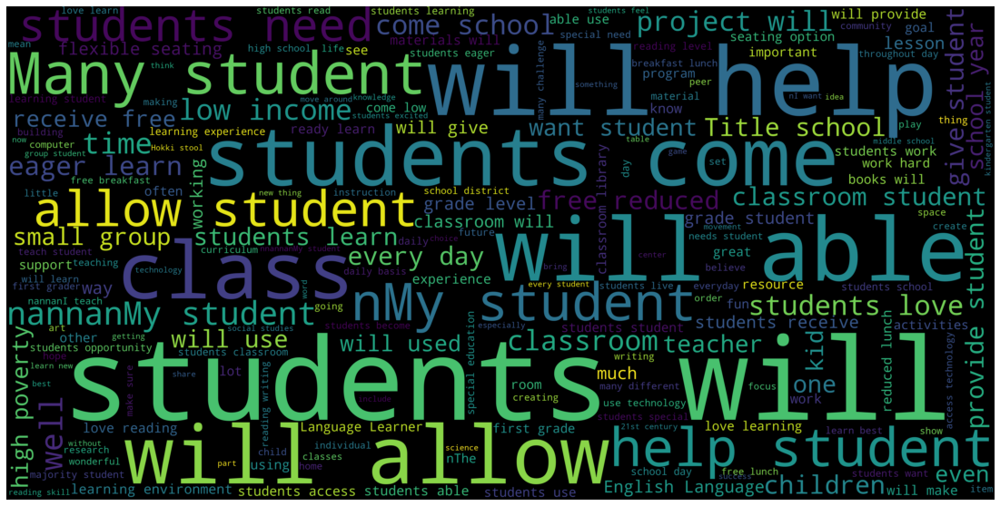

In [38]:
#cluster 5
words=''
for i in cluster5:
    words+=str(i)
from wordcloud import WordCloud
wordcloud = WordCloud(width=5000,height=2500,background_color="black").generate(words)

# Display the generated image:
plt.figure( figsize=(20,10)) 
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

### Taking 5K datapoints 

In [39]:
#X with 5k points and 5k features
X_5k = X_with_5k_features[:5000]
X_5k.shape

(5000, 5000)

### Applying AgglomerativeClustering with n_clusters = 2 

In [40]:
from sklearn.cluster import AgglomerativeClustering

aggcl=AgglomerativeClustering(n_clusters=2).fit(X_5k.toarray())

In [41]:
cluster1=[]
cluster2=[]
res1 = []
res2 = []
for i in tqdm(range(aggcl.labels_.shape[0])):
    if aggcl.labels_[i] == 0:
        cluster1.append(essays[i])
        res1.append(results[i])
    elif aggcl.labels_[i] == 1:
        cluster2.append(essays[i])
        res2.append(results[i])

100%|██████████████████████████████████████████████████████████████████████████| 5000/5000 [00:00<00:00, 707159.43it/s]


In [42]:
print('project approval status is {}\n'.format(res1[0]))
print('essay is\n',cluster1[0])

project approval status is 1

essay is
 I have been fortunate enough to use the Fairy Tale STEM kits in my classroom as well as the STEM journals, which my students really enjoyed.  I would love to implement more of the Lakeshore STEM kits in my classroom for the next school year as they provide excellent and engaging STEM lessons.My students come from a variety of backgrounds, including language and socioeconomic status.  Many of them don't have a lot of experience in science and engineering and these kits give me the materials to provide these exciting opportunities for my students.Each month I try to do several science or STEM/STEAM projects.  I would use the kits and robot to help guide my science instruction in engaging and meaningful ways.  I can adapt the kits to my current language arts pacing guide where we already teach some of the material in the kits like tall tales (Paul Bunyan) or Johnny Appleseed.  The following units will be taught in the next school year where I will i

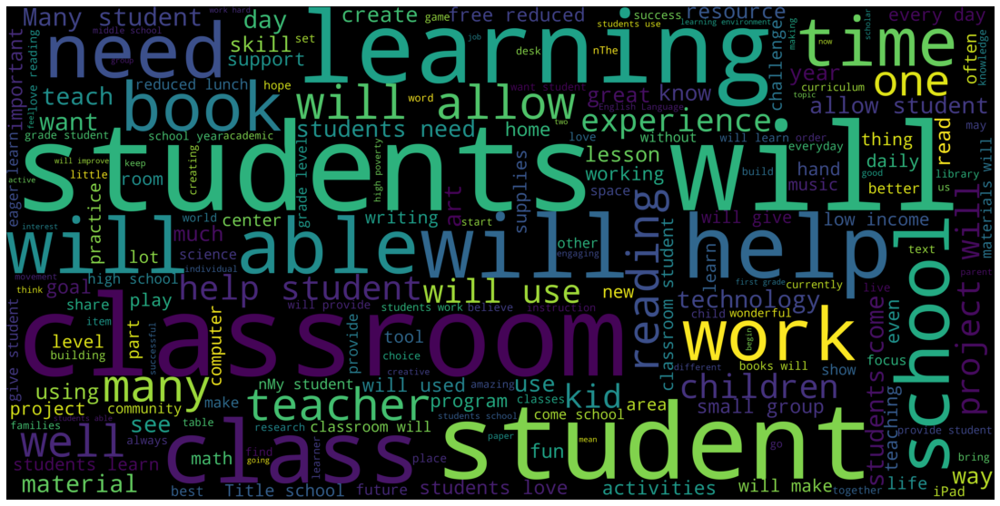

In [43]:
#cluster 1
words=''
for i in cluster1:
    words+=str(i)
from wordcloud import WordCloud
wordcloud = WordCloud(width=5000,height=2500,background_color="black").generate(words)

# Display the generated image:
plt.figure( figsize=(20,10)) 
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [44]:
print('project approval status is {}\n'.format(res2[0]))
print('essay is\n',cluster2[0])

project approval status is 1

essay is
 Imagine being 8-9 years old. You're in your third grade classroom. You see bright lights, the kid next to you is chewing gum, the birds are making noise, the street outside is buzzing with cars, it's hot, and your teacher is asking you to focus on learning. Ack! You need a break! So do my students.Most of my students have autism, anxiety, another disability, or all of the above. It is tough to focus in school due to sensory overload or emotions. My students have a lot to deal with in school, but I think that makes them the most incredible kids on the planet. They are kind, caring, and sympathetic. They know what it's like to be overwhelmed, so they understand when someone else is struggling. They are open-minded and compassionate. They are the kids who will someday change the world.It is tough to do more than one thing at a time. When sensory overload gets in the way, it is the hardest thing in the world to focus on learning. My students need man

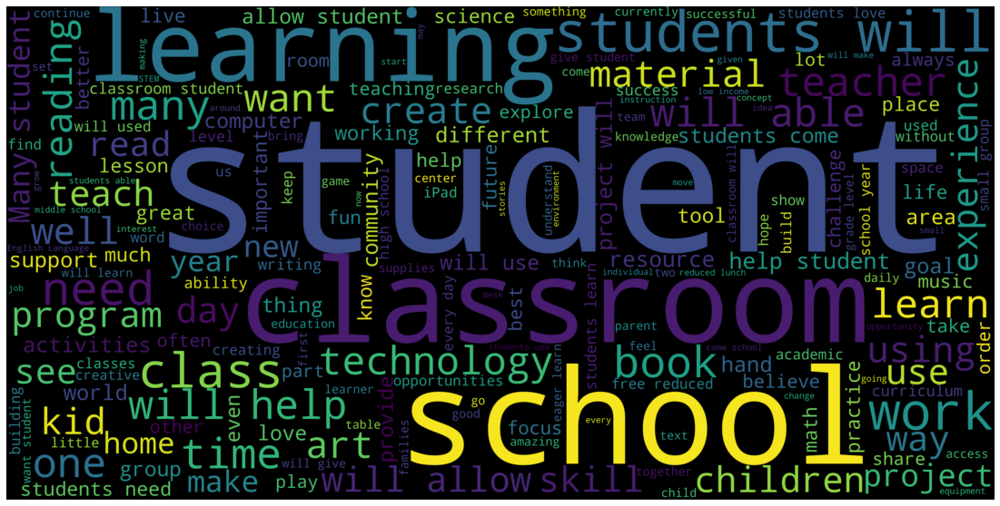

In [45]:
#cluster 2
words=''
for i in cluster2:
    words+=str(i)
from wordcloud import WordCloud
wordcloud = WordCloud(width=5000,height=2500,background_color="black").generate(words)

# Display the generated image:
plt.figure( figsize=(20,10)) 
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

### Applying AgglomerativeClustering with n_clusters = 5

In [46]:
from sklearn.cluster import AgglomerativeClustering

aggcl=AgglomerativeClustering(n_clusters=5).fit(X_5k.toarray())

In [47]:
cluster1=[]
cluster2=[]
cluster3=[]
cluster4=[]
cluster5=[]
res1 = []
res2 = []
res3 = []
res4 = []
res5 = []
for i in tqdm(range(aggcl.labels_.shape[0])):
    if aggcl.labels_[i] == 0:
        cluster1.append(essays[i])
        res1.append(results[i])
    elif aggcl.labels_[i] == 1:
        cluster2.append(essays[i])
        res2.append(results[i])
    elif kmeans.labels_[i] == 2:
        cluster3.append(essays[i])
        res3.append(results[i])
    elif  kmeans.labels_[i] == 3:
        cluster4.append(essays[i])
        res4.append(results[i])
    elif  kmeans.labels_[i] == 4:
        cluster5.append(essays[i])
        res5.append(results[i])

100%|██████████████████████████████████████████████████████████████████████████| 5000/5000 [00:00<00:00, 494354.82it/s]


In [48]:
print('project approval status is {}\n'.format(res1[0]))
print('essay is\n',cluster1[0])

project approval status is 1

essay is
 Imagine being 8-9 years old. You're in your third grade classroom. You see bright lights, the kid next to you is chewing gum, the birds are making noise, the street outside is buzzing with cars, it's hot, and your teacher is asking you to focus on learning. Ack! You need a break! So do my students.Most of my students have autism, anxiety, another disability, or all of the above. It is tough to focus in school due to sensory overload or emotions. My students have a lot to deal with in school, but I think that makes them the most incredible kids on the planet. They are kind, caring, and sympathetic. They know what it's like to be overwhelmed, so they understand when someone else is struggling. They are open-minded and compassionate. They are the kids who will someday change the world.It is tough to do more than one thing at a time. When sensory overload gets in the way, it is the hardest thing in the world to focus on learning. My students need man

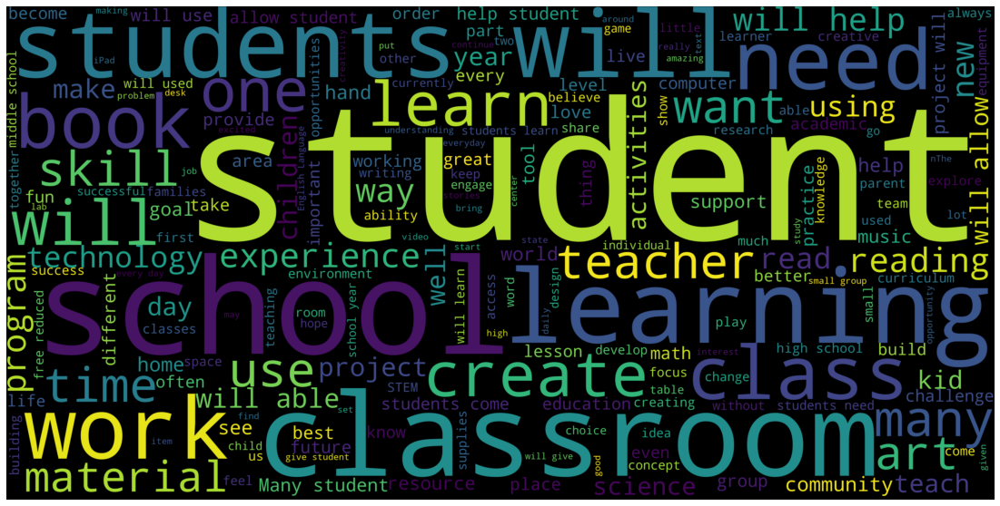

In [49]:
#cluster 1
words=''
for i in cluster1:
    words+=str(i)
from wordcloud import WordCloud
wordcloud = WordCloud(width=5000,height=2500,background_color="black").generate(words)

# Display the generated image:
plt.figure( figsize=(20,10)) 
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [50]:
print('project approval status is {}\n'.format(res2[0]))
print('essay is\n',cluster2[0])

project approval status is 0

essay is
 It’s not enough to read a book and write an essay to connect with and deeply understand core subjects. I want to engage my students' imagination, creativity, and reasoning. I hope by introducing the creative and problem-solving skills required of movie making, I will jump start their future.My students come from diverse family situations with an increasing number from lower income levels. We were recently re-designated a Title I school (students receive free breakfast and lunch).  Many have non-English speaking parents, working multiple jobs. I have a disproportionate number of struggling readers (2 years behind).  They are good kids, who want to improve their skills, but traditional methods don’t seem to help. They become easily frustrated and unmotivated.  When I use creative approaches -- student-written plays, comic strips, and presentations -- they are engaged and produce higher quality work while displaying greater confidence with the mater

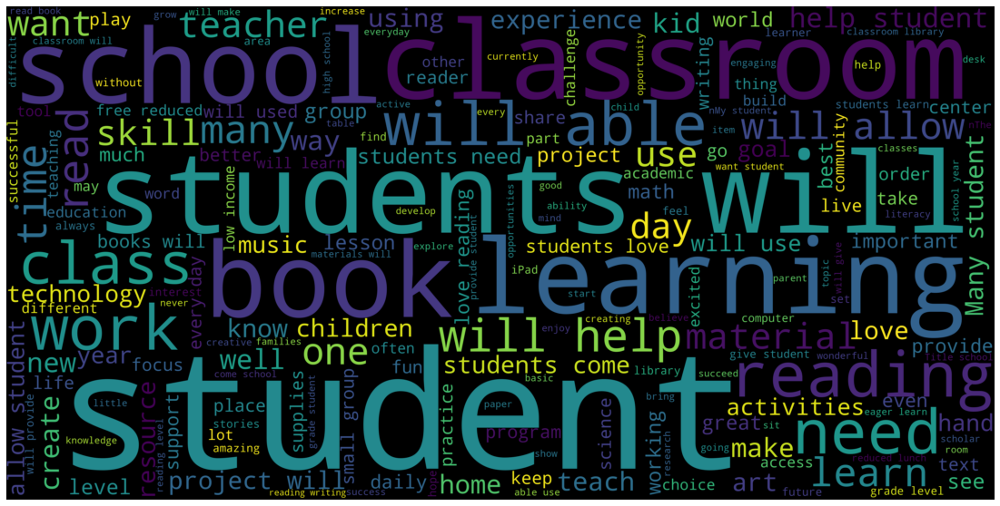

In [51]:
#cluster 2
words=''
for i in cluster2:
    words+=str(i)
from wordcloud import WordCloud
wordcloud = WordCloud(width=5000,height=2500,background_color="black").generate(words)

# Display the generated image:
plt.figure( figsize=(20,10)) 
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [52]:
print('project approval status is {}\n'.format(res3[0]))
print('essay is\n',cluster3[0])

project approval status is 1

essay is
 I teach 4th grade math, writing, social studies, and science. My students are excited learners and constantly want to exceed expectations. They work together as a class to make the most of each and every single day, despite many struggling to have their basic needs met due to various circumstances.My 4th grade students are excited learners and constantly want to exceed expectations. My students work together as a class to make the most of each and every single day. They work hard and treat each other with love and respect - a skill that is taught and practiced at school.  Many of my students come from low-income families and have a difficult time coming up with basic classroom needs, like pencils, paper, and tissues.Very few students have materials at home to help them succeed at school, and even fewer having quality reading materials at home.  This in turn has made motivating students to read a great challenge.  TIME FOR KIDS is extremely engagi

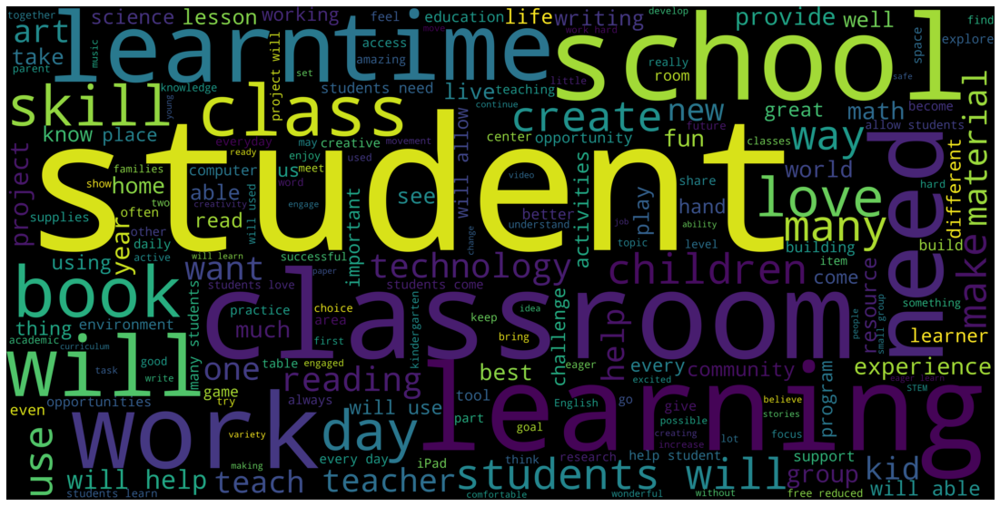

In [53]:
#cluster 3
words=''
for i in cluster3:
    words+=str(i)
from wordcloud import WordCloud
wordcloud = WordCloud(width=5000,height=2500,background_color="black").generate(words)

# Display the generated image:
plt.figure( figsize=(20,10)) 
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [54]:
print('project approval status is {}\n'.format(res4[0]))
print('essay is\n',cluster4[0])

project approval status is 1

essay is
 In my classroom we explore and delve into real world problems. We use our diverse backgrounds to each bring a different perspective into class to help us solve, create and engineer together. We do not have a set curriculum, but we follow the Science and Engineering practices for each grade level.My students are varied and fabulous. I teach kindergarten through fifth grade. My students come from all walks of life, have different backgrounds, histories, cultures, and understandings. We work collectively to use our differences to enhance our learning and our understanding of our world. My school is amazing and our students and teachers all feel supported in what we do. My students come in with questions they want answers to and we explore those questions together. We use our library, the public library, our school resources, online resources, and other things to enhance learning. However, my students hunger for some new resources and supplies to be 

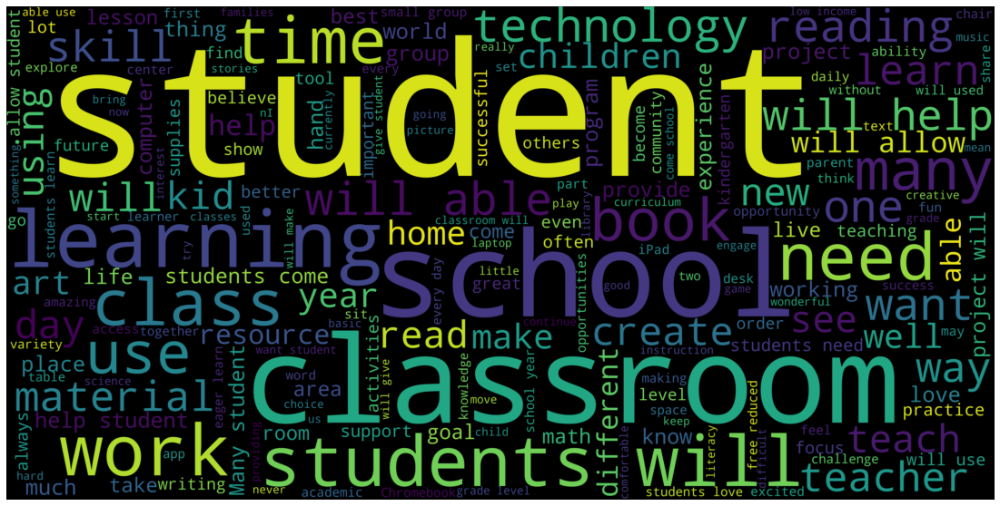

In [55]:
#cluster 4
words=''
for i in cluster4:
    words+=str(i)
from wordcloud import WordCloud
wordcloud = WordCloud(width=5000,height=2500,background_color="black").generate(words)

# Display the generated image:
plt.figure( figsize=(20,10)) 
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [56]:
print('project approval status is {}\n'.format(res5[0]))
print('essay is\n',cluster5[0])

project approval status is 1

essay is
 Do you remember the first time you saw Star Wars or Wall-E's robots? They were so wonderfully complex and amazing to see in action. Students love robots and enjoy programming them. I'd like to give them the opportunity to use coding to manipulate simple robots.I am a teacher/librarian at an elementary school that services many Navy and Army families in Hawaii.  The library is the center of encouraging literacy on our Preschool-6th grade campus. About half of the students at my school are military dependents who move locations every three years.My students need a Dash and Dot robot duo to explore robotics and coding.  Students will learn through games and puzzles how to make the robots move and sense various stimuli.  Blocky and Wonder apps will be used to program the robots.  Students will collaborate, communicate, problem solve, and critically think while experimenting with the robots to navigate obstacle courses and other challenges.  These rob

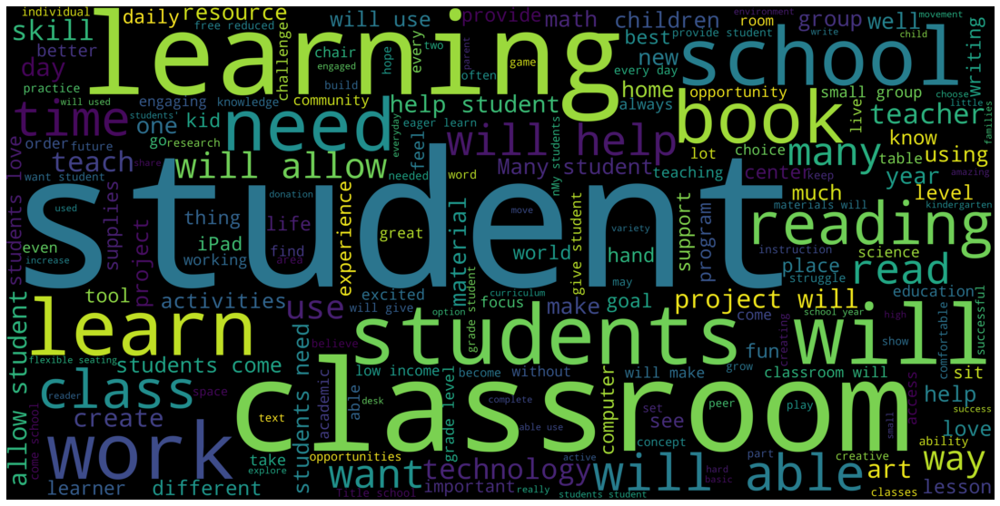

In [57]:
#cluster 5
words=''
for i in cluster5:
    words+=str(i)
from wordcloud import WordCloud
wordcloud = WordCloud(width=5000,height=2500,background_color="black").generate(words)

# Display the generated image:
plt.figure( figsize=(20,10)) 
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

### Finding best eps

In [59]:
## https://datascience.stackexchange.com/questions/10162/knn-distance-plot-for-determining-eps-of-dbscan

from sklearn.neighbors import NearestNeighbors

nn=NearestNeighbors(n_neighbors=10000).fit(X_with_5k_features)
distances, indices = nn.kneighbors(X_with_5k_features)

In [60]:
#get last cloumn
#https://stackoverflow.com/questions/4455076/how-to-access-the-ith-column-of-a-numpy-multidimensional-array
distance=distances[:,[-1]].tolist()
distance = [item for sublist in distance for item in sublist]
distance.sort()
print(distance[0])

19.672315572906


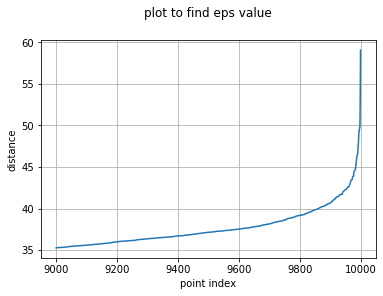

In [61]:
plt.plot(list(range(1,10000)[-1000:]),distance[-1000:])
plt.grid()
plt.title('plot to find eps value', size = 12, y = 1.08)
plt.ylabel('distance')
plt.xlabel('point index')
plt.show()

In [62]:
#from the above plot
best_eps = 45

### Applying DBSCAN with obtained best_eps 

In [64]:
#It's a standard practice to take the min_samples = 2 * number of dimensions in the data, 
#when the nature of the data is unknown.
#as our data is 5k dimensions, we take min_samples = 10k (2 * 5k)
from sklearn.cluster import DBSCAN
dbscan = DBSCAN(eps=best_eps, min_samples=10000, n_jobs=-1)
dbscan.fit(X_with_5k_features)
print('No of clusters: ',len(set(dbscan.labels_)))
print('Cluster are including noise i.e -1: ',set(dbscan.labels_))

No of clusters:  2
Cluster are including noise i.e -1:  {0, -1}


In [65]:
cluster=[]
noisecluster=[]
for i in range(dbscan.labels_.shape[0]):
    if dbscan.labels_[i] == 0:
        cluster.append(essays[i])
    elif dbscan.labels_[i] == -1:
        noisecluster.append(essays[i])

In [66]:
print('essay in one of the cluster is\n',cluster[0])

essay in one of the cluster is
 I have been fortunate enough to use the Fairy Tale STEM kits in my classroom as well as the STEM journals, which my students really enjoyed.  I would love to implement more of the Lakeshore STEM kits in my classroom for the next school year as they provide excellent and engaging STEM lessons.My students come from a variety of backgrounds, including language and socioeconomic status.  Many of them don't have a lot of experience in science and engineering and these kits give me the materials to provide these exciting opportunities for my students.Each month I try to do several science or STEM/STEAM projects.  I would use the kits and robot to help guide my science instruction in engaging and meaningful ways.  I can adapt the kits to my current language arts pacing guide where we already teach some of the material in the kits like tall tales (Paul Bunyan) or Johnny Appleseed.  The following units will be taught in the next school year where I will implement

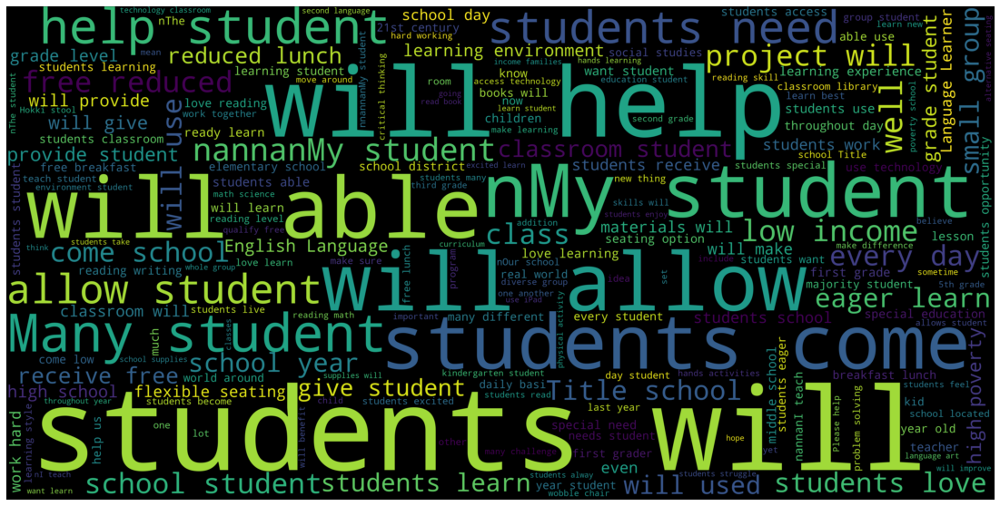

In [67]:
#Cluster wordcloud
words=''
for i in cluster:
    words+=str(i)
from wordcloud import WordCloud
wordcloud = WordCloud(width=5000,height=2500,background_color="black").generate(words)

# Display the generated image:
plt.figure( figsize=(20,10)) 
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [68]:
print('essay in one of the cluster is\n',noisecluster[0])

essay in one of the cluster is
 What makes your students special? Specific details about their background, your neighborhood, and your school are all helpful. What makes your students special? Specific details about their background, your neighborhood, and your school are all helpful. What makes your students special? Specific details about their background, your neighborhood, and your school are all helpful. What makes your students special? Specific details about their background, your neighborhood, and your school are all helpful.\r\n\r\nWhat makes your students special? Specific details about their background, your neighborhood, and your school are all helpful. What makes your students special? Specific details about their background, your neighborhood, and your school are all helpful. What makes your students special? Specific details about their background, your neighborhood, and your school are all helpful. What makes your students special? Specific details about their backgroun

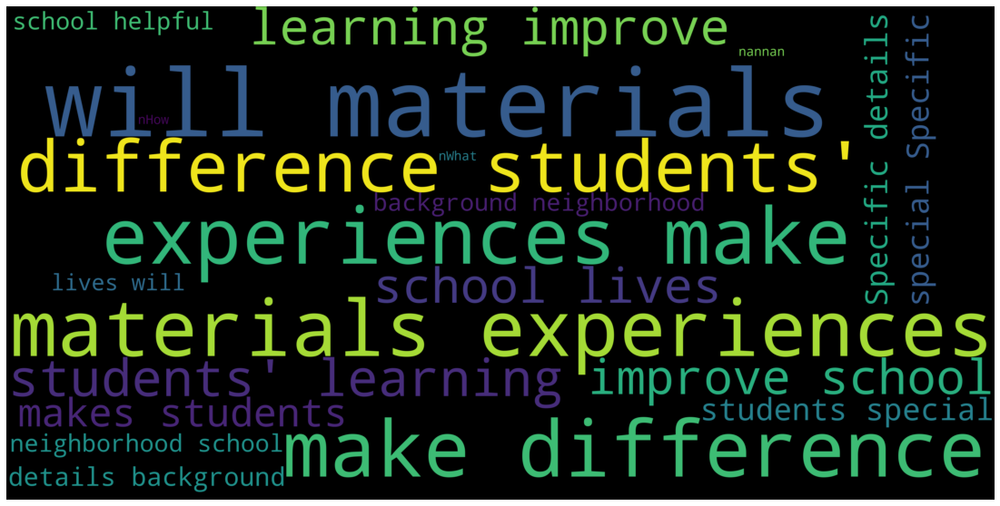

In [69]:
#noisecluster wordcloud
words=''
for i in noisecluster:
    words+=str(i)
from wordcloud import WordCloud
wordcloud = WordCloud(width=5000,height=2500,background_color="black").generate(words)

# Display the generated image:
plt.figure( figsize=(20,10)) 
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

## Conclusion

In [70]:
# http://zetcode.com/python/prettytable/
from prettytable import PrettyTable

table = PrettyTable()
table.field_names = ["Vectorizer", "Clustering", "Hyper Parameter", "#Clusters"]

table.add_row(['BOW', 'K-Means', 'K = 5', 5])
table.add_row(['BOW', 'Agglomerative', 'n_clusters = 5', 5])
table.add_row(['BOW', 'DBScan', ('EPS = '+str(best_eps) + ', Min Samples = 10000'), 2])
print(table)


+------------+---------------+-------------------------------+-----------+
| Vectorizer |   Clustering  |        Hyper Parameter        | #Clusters |
+------------+---------------+-------------------------------+-----------+
|    BOW     |    K-Means    |             K = 5             |     5     |
|    BOW     | Agglomerative |         n_clusters = 5        |     5     |
|    BOW     |     DBScan    | EPS = 45, Min Samples = 10000 |     2     |
+------------+---------------+-------------------------------+-----------+


# Summary

* Applied K-Means, Hierarchical Agglomerative and DBSCAN Clustering techniques on BOW vectorizer
* Obtained the best number of clusters for K-means and Hierarchical Agglomerative clustering as 5
* For DBSCAN the obtaibed best hyper-parameters are eps = 45 using elbow method and min_samples = 10000
* WordCloud for each cluster is also printed